In [1]:
import pandas as pd
import os

# 1. Define Paths
base_path = '/kaggle/input/chest-xrays-indiana-university'
reports_path = os.path.join(base_path, 'indiana_reports.csv')
projections_path = os.path.join(base_path, 'indiana_projections.csv')
images_path = os.path.join(base_path, 'images/images_normalized')

# 2. Load the Datasets
reports_df = pd.read_csv(reports_path)
projections_df = pd.read_csv(projections_path)

# 3. Merge the datasets on 'uid'
# This links each image (projection) to its corresponding text report
merged_df = pd.merge(reports_df, projections_df, on='uid')

# 4. Data Exploration & Statistics
num_reports = reports_df['uid'].nunique()
num_images_in_folder = len(os.listdir(images_path))
num_images_linked = merged_df['filename'].nunique()

print("-" * 30)
print("DATASET STATISTICS")
print("-" * 30)
print(f"Total Number of Unique Reports: {num_reports}")
print(f"Total Number of Images in Folder: {num_images_in_folder}")
print(f"Total Number of Images Linked to Reports: {num_images_linked}")
print("-" * 30)

# 5. Displaying the File Structure
print("\nFILE STRUCTURE:")
def list_files(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 4 * (level + 1)
        # Limit display to first 5 files per folder to keep it clean
        for f in files[:5]:
            print(f"{subindent}{f}")
        if len(files) > 5:
            print(f"{subindent}...")

list_files(base_path)

# 6. Preview the Merged Data
print("\nMERGED DATAFRAME PREVIEW:")
display(merged_df.head())

------------------------------
DATASET STATISTICS
------------------------------
Total Number of Unique Reports: 3851
Total Number of Images in Folder: 7470
Total Number of Images Linked to Reports: 7466
------------------------------

FILE STRUCTURE:
chest-xrays-indiana-university/
    indiana_projections.csv
    indiana_reports.csv
    images/
        images_normalized/
            349_IM-1697-2001.dcm.png
            607_IM-2196-1001.dcm.png
            2832_IM-1249-2001.dcm.png
            699_IM-2263-2001.dcm.png
            1931_IM-0602-2001.dcm.png
            ...

MERGED DATAFRAME PREVIEW:


,uid,MeSH,Problems,image,indication,comparison,findings,impression,filename,projection
0,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-4001.dcm.png,Frontal
1,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-3001.dcm.png,Lateral
2,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-1001.dcm.png,Frontal
3,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-2001.dcm.png,Lateral
4,3,normal,normal,Xray Chest PA and Lateral,"rib pain after a XXXX, XXXX XXXX steps this XX...",NaN,NaN,"No displaced rib fractures, pneumothorax, or p...",3_IM-1384-1001.dcm.png,Frontal


In [2]:
# 1. Count Total Reports (Unique examinations)
reports_df = pd.read_csv('/kaggle/input/chest-xrays-indiana-university/indiana_reports.csv')
print(f"Total Reports: {len(reports_df)}")

# 2. Count Total Physical Images
images_dir = '/kaggle/input/chest-xrays-indiana-university/images/images_normalized'
# Filtering for png files to ensure an accurate count
total_images = len([img for img in os.listdir(images_dir) if img.endswith('.png')])
print(f"Total Images:  {total_images}")

print("\nFILE STRUCTURE:")
def list_files(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print(f"{indent}{os.path.basename(root)}/")
        subindent = ' ' * 4 * (level + 1)
        # Limit display to first 5 files per folder to keep it clean
        for f in files[:5]:
            print(f"{subindent}{f}")
        if len(files) > 5:
            print(f"{subindent}...")

list_files(base_path)

Total Reports: 3851
Total Images:  7470

FILE STRUCTURE:
chest-xrays-indiana-university/
    indiana_projections.csv
    indiana_reports.csv
    images/
        images_normalized/
            349_IM-1697-2001.dcm.png
            607_IM-2196-1001.dcm.png
            2832_IM-1249-2001.dcm.png
            699_IM-2263-2001.dcm.png
            1931_IM-0602-2001.dcm.png
            ...


In [3]:
import pandas as pd

# Load the reports and projections
reports_df = pd.read_csv('/kaggle/input/chest-xrays-indiana-university/indiana_reports.csv')
projections_df = pd.read_csv('/kaggle/input/chest-xrays-indiana-university/indiana_projections.csv')

print("--- First 5 Rows of Reports ---")
display(reports_df.head())

print("\n--- First 5 Rows of Projections ---")
display(projections_df.head())

--- First 5 Rows of Reports ---


,uid,MeSH,Problems,image,indication,comparison,findings,impression
0,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.
1,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.
2,3,normal,normal,Xray Chest PA and Lateral,"rib pain after a XXXX, XXXX XXXX steps this XX...",NaN,NaN,"No displaced rib fractures, pneumothorax, or p..."
3,4,"Pulmonary Disease, Chronic Obstructive;Bullous...","Pulmonary Disease, Chronic Obstructive;Bullous...","PA and lateral views of the chest XXXX, XXXX a...",XXXX-year-old XXXX with XXXX.,None available,There are diffuse bilateral interstitial and a...,1. Bullous emphysema and interstitial fibrosis...
4,5,Osteophyte/thoracic vertebrae/multiple/small;T...,Osteophyte;Thickening;Lung,Xray Chest PA and Lateral,Chest and nasal congestion.,NaN,The cardiomediastinal silhouette and pulmonary...,No acute cardiopulmonary abnormality.



--- First 5 Rows of Projections ---


,uid,filename,projection
0,1,1_IM-0001-4001.dcm.png,Frontal
1,1,1_IM-0001-3001.dcm.png,Lateral
2,2,2_IM-0652-1001.dcm.png,Frontal
3,2,2_IM-0652-2001.dcm.png,Lateral
4,3,3_IM-1384-1001.dcm.png,Frontal


PATIENT UID: 1
FINDINGS:    The cardiac silhouette and mediastinum size are within normal limits. There is no pulmonary edema. There is no focal consolidation. There are no XXXX of a pleural effusion. There is no evidence of pneumothorax.
IMPRESSION:  Normal chest x-XXXX.


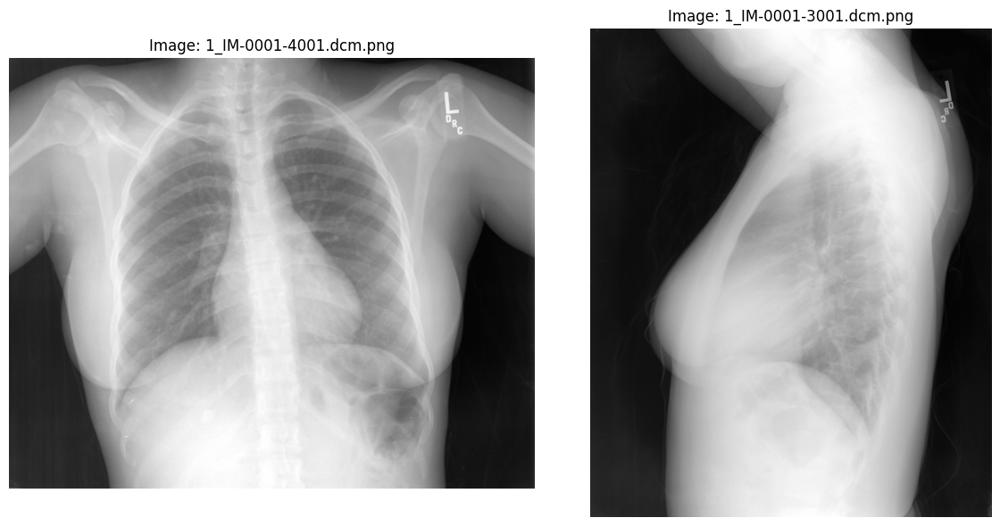

In [4]:
import cv2
import matplotlib.pyplot as plt
import os

# 1. Pick the first unique patient from your merged dataframe
sample_uid = merged_df['uid'].unique()[0]
sample_data = merged_df[merged_df['uid'] == sample_uid]

# 2. Display the text details
print(f"PATIENT UID: {sample_uid}")
print(f"FINDINGS:    {sample_data['findings'].iloc[0]}")
print(f"IMPRESSION:  {sample_data['impression'].iloc[0]}")

# 3. Plot the associated images
img_folder = "/kaggle/input/chest-xrays-indiana-university/images/images_normalized/"
img_list = sample_data['filename'].tolist()

plt.figure(figsize=(12, 6))
for i, file_name in enumerate(img_list):
    path = os.path.join(img_folder, file_name)
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.subplot(1, len(img_list), i + 1)
    plt.imshow(img)
    plt.title(f"Image: {file_name}")
    plt.axis('off')

plt.tight_layout()
plt.show()

--- Distribution Table ---
 Images per Report  Number of Reports
                 1                446
                 2               3210
                 3                181
                 4                 13
                 5                  1


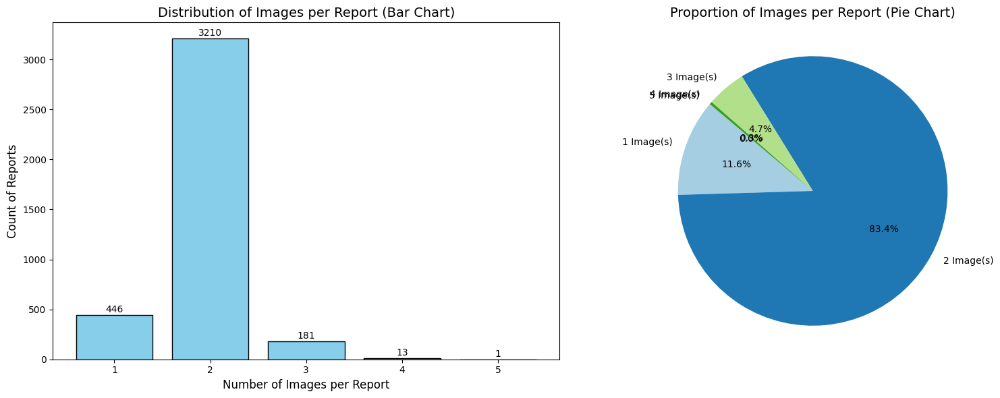

In [5]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Calculate the number of images associated with each unique report (uid)
image_counts_per_report = merged_df.groupby('uid').size()

# 2. Get the distribution (how many reports have 1 image, 2 images, etc.)
distribution = image_counts_per_report.value_counts().sort_index().reset_index()
distribution.columns = ['Images per Report', 'Number of Reports']

# Display the Distribution Table
print("--- Distribution Table ---")
print(distribution.to_string(index=False))

# 3. Create Visualizations
plt.figure(figsize=(16, 6))

# Plot 1: Bar Graph
plt.subplot(1, 2, 1)
bars = plt.bar(distribution['Images per Report'].astype(str), distribution['Number of Reports'], color='skyblue', edgecolor='black')
plt.title('Distribution of Images per Report (Bar Chart)', fontsize=14)
plt.xlabel('Number of Images per Report', fontsize=12)
plt.ylabel('Count of Reports', fontsize=12)

# Adding labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, yval, ha='center', va='bottom')

# Plot 2: Pie Chart
plt.subplot(1, 2, 2)
plt.pie(distribution['Number of Reports'], 
        labels=[f"{x} Image(s)" for x in distribution['Images per Report']], 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=plt.cm.Paired.colors)
plt.title('Proportion of Images per Report (Pie Chart)', fontsize=14)

plt.tight_layout()
plt.show()

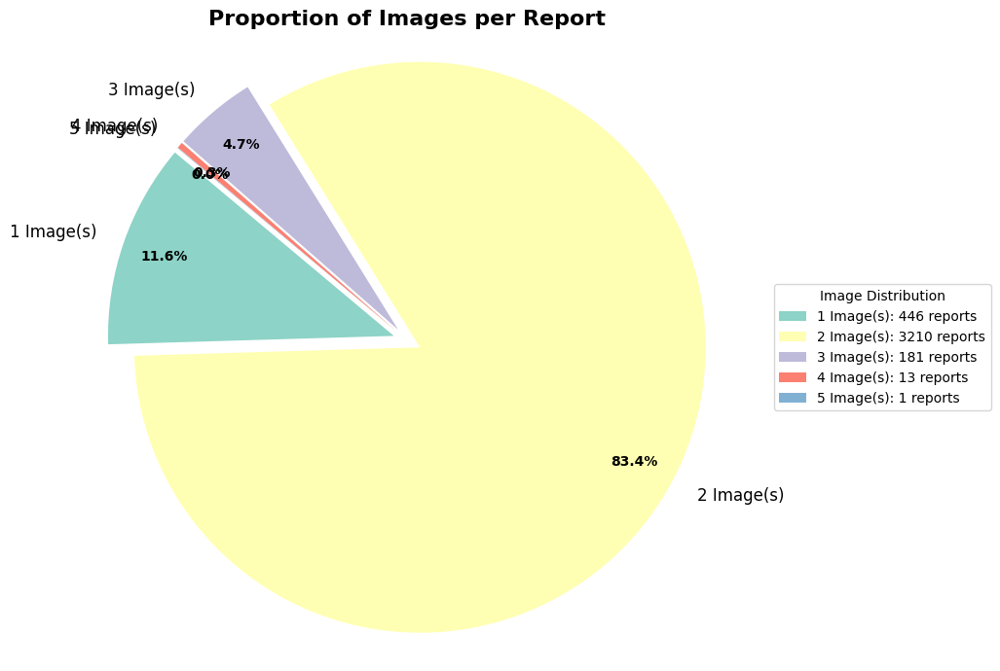

In [6]:
import matplotlib.pyplot as plt

# 1. Define specific colors or use a professional color map
colors = plt.cm.Set3(range(len(distribution)))

plt.figure(figsize=(10, 7))

# 2. Create the Pie Chart with enhanced styling
patches, texts, autotexts = plt.pie(
    distribution['Number of Reports'], 
    labels=[f"{x} Image(s)" for x in distribution['Images per Report']], 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=colors,
    pctdistance=0.85, # Moves the percentage labels further from center
    explode=[0.05] * len(distribution) # Slightly separates each slice
)

# 3. Styling the text for better visibility
plt.setp(autotexts, size=10, weight="bold")
plt.setp(texts, size=12)

# 4. Add a legend to the side
plt.legend(
    patches, 
    [f"{x} Image(s): {y} reports" for x, y in zip(distribution['Images per Report'], distribution['Number of Reports'])],
    title="Image Distribution",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)
)

plt.title('Proportion of Images per Report', fontsize=16, fontweight='bold')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.tight_layout()
plt.show()

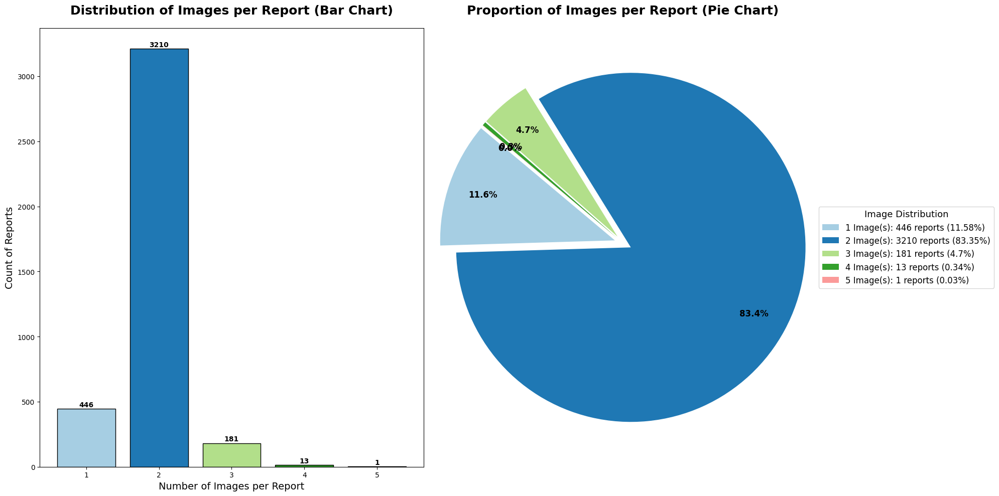


IMAGE DISTRIBUTION SUMMARY TABLE
 Images per Report  Number of Reports Percentage
                 1                446     11.58%
                 2               3210     83.35%
                 3                181       4.7%
                 4                 13      0.34%
                 5                  1      0.03%


In [7]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Calculate the distribution from the existing merged_df
image_counts_per_report = merged_df.groupby('uid').size()
distribution = image_counts_per_report.value_counts().sort_index().reset_index()
distribution.columns = ['Images per Report', 'Number of Reports']

# 2. Calculate percentages for the table and legend
total_reports = distribution['Number of Reports'].sum()
distribution['Percentage'] = ((distribution['Number of Reports'] / total_reports) * 100).round(2).astype(str) + '%'

# 3. Visualization Setup (Large size to prevent crowding)
plt.figure(figsize=(20, 10))

# --- Plot 1: Bar Chart ---
plt.subplot(1, 2, 1)
colors_bar = plt.cm.Paired(range(len(distribution)))
bars = plt.bar(distribution['Images per Report'].astype(str), distribution['Number of Reports'], 
               color=colors_bar, edgecolor='black')
plt.title('Distribution of Images per Report (Bar Chart)', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of Images per Report', fontsize=14)
plt.ylabel('Count of Reports', fontsize=14)

# Add count labels on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 5, int(yval), ha='center', va='bottom', fontweight='bold')

# --- Plot 2: Pie Chart (No Overlap) ---
plt.subplot(1, 2, 2)
colors_pie = plt.cm.Paired(range(len(distribution)))
patches, texts, autotexts = plt.pie(
    distribution['Number of Reports'], 
    labels=None, # Labels removed from chart to prevent overlap
    autopct='%1.1f%%', 
    startangle=140, 
    colors=colors_pie,
    explode=[0.05] * len(distribution), 
    pctdistance=0.8,
    textprops={'fontsize': 12, 'weight': 'bold'}
)

plt.title('Proportion of Images per Report (Pie Chart)', fontsize=18, fontweight='bold', pad=20)
plt.axis('equal') 

# legend placed outside to avoid overlapping the pie
plt.legend(
    patches, 
    [f"{x} Image(s): {y} reports ({p})" for x, y, p in zip(distribution['Images per Report'], 
                                                          distribution['Number of Reports'], 
                                                          distribution['Percentage'])],
    title="Image Distribution",
    title_fontsize='13',
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1),
    fontsize=12
)

plt.tight_layout()
plt.show()

# 4. Display the Summary Table
print("\n" + "="*50)
print("IMAGE DISTRIBUTION SUMMARY TABLE")
print("="*50)
print(distribution.to_string(index=False))
print("="*50)


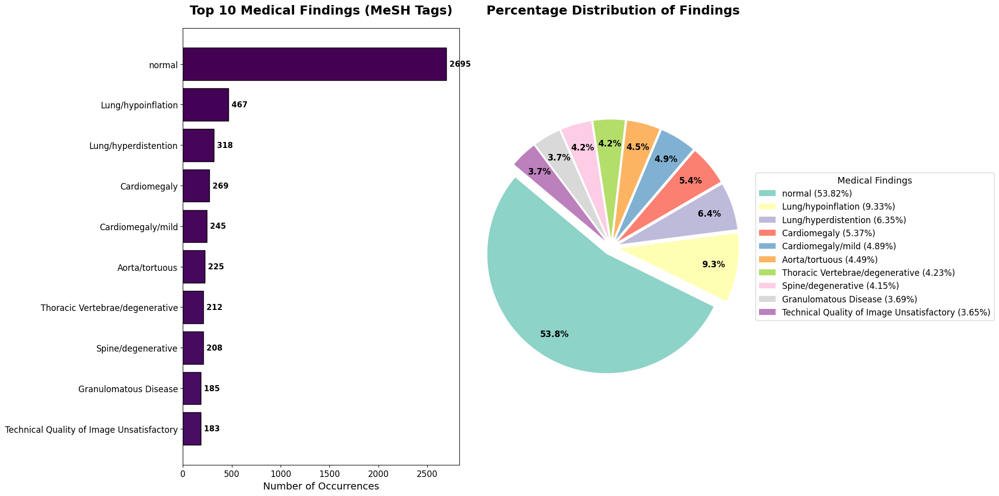


TOP 10 FINDINGS SUMMARY TABLE
                                      Tag  Count Percentage
                                   normal   2695     53.82%
                       Lung/hypoinflation    467      9.33%
                     Lung/hyperdistention    318      6.35%
                             Cardiomegaly    269      5.37%
                        Cardiomegaly/mild    245      4.89%
                           Aorta/tortuous    225      4.49%
          Thoracic Vertebrae/degenerative    212      4.23%
                       Spine/degenerative    208      4.15%
                    Granulomatous Disease    185      3.69%
Technical Quality of Image Unsatisfactory    183      3.65%


In [8]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. Process MeSH column (Split multiple tags per report into individual counts)
mesh_series = merged_df['MeSH'].dropna().str.split(';').explode().str.strip()

# 2. Get Top 10 Tags and calculate Percentages
top_mesh = mesh_series.value_counts().head(10)
mesh_dist = top_mesh.reset_index()
mesh_dist.columns = ['Tag', 'Count']

# Calculate percentage for the table
total_top_counts = mesh_dist['Count'].sum()
mesh_dist['Percentage'] = ((mesh_dist['Count'] / total_top_counts) * 100).round(2).astype(str) + '%'

# 3. Visualization Setup (Significantly larger figure size)
plt.figure(figsize=(20, 10))

# --- Plot 1: Large Bar Graph ---
plt.subplot(1, 2, 1)
colors_bar = plt.cm.viridis(range(len(mesh_dist)))
bars = plt.barh(mesh_dist['Tag'], mesh_dist['Count'], color=colors_bar, edgecolor='black')
plt.gca().invert_yaxis() # Put highest count at top
plt.title('Top 10 Medical Findings (MeSH Tags)', fontsize=18, fontweight='bold', pad=20)
plt.xlabel('Number of Occurrences', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Adding labels to bars
for i, v in enumerate(mesh_dist['Count']):
    plt.text(v + 5, i, f" {v}", color='black', va='center', fontweight='bold', fontsize=11)

# --- Plot 2: Large Pie Chart (Fixed Overlap) ---
plt.subplot(1, 2, 2)
colors_pie = plt.cm.Set3(range(len(mesh_dist)))
patches, texts, autotexts = plt.pie(
    mesh_dist['Count'], 
    labels=None, # Removed labels from the pie to prevent overlapping
    autopct='%1.1f%%', 
    startangle=140, 
    colors=colors_pie,
    explode=[0.07] * len(mesh_dist), # Pull slices apart
    pctdistance=0.8, # Distance of percentage text from center
    textprops={'fontsize': 12, 'weight': 'bold'}
)

plt.title('Percentage Distribution of Findings', fontsize=18, fontweight='bold', pad=20)
plt.axis('equal') 

# Fixed Legend: Moved outside using bbox_to_anchor
plt.legend(
    patches, 
    [f"{tag} ({pct})" for tag, pct in zip(mesh_dist['Tag'], mesh_dist['Percentage'])],
    title="Medical Findings",
    title_fontsize='13',
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1), # Places legend completely clear of the chart
    fontsize=12
)

plt.tight_layout()
plt.show()

# Display the enhanced table
print("\n" + "="*50)
print("TOP 10 FINDINGS SUMMARY TABLE")
print("="*50)
print(mesh_dist.to_string(index=False))
print("="*50)

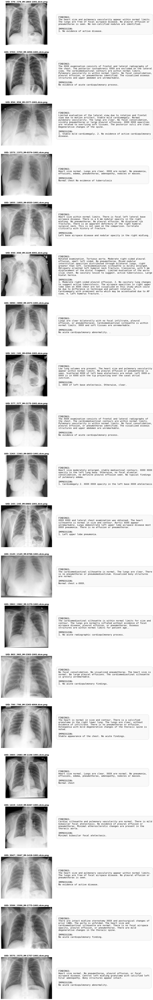

In [9]:
import cv2
import matplotlib.pyplot as plt
import os
import textwrap

# 1. Clean the data for sampling (remove rows where findings are empty)
valid_df = merged_df.dropna(subset=['findings'])

# 2. Get 20 random unique UIDs
unique_uids = valid_df['uid'].unique()
sample_uids = pd.Series(unique_uids).sample(n=20, random_state=42).tolist()

# 3. Setup the plot - 20 rows, 2 columns (Image | Text)
fig, axes = plt.subplots(nrows=20, ncols=2, figsize=(18, 100)) # Height is 100 to ensure clarity
img_folder = "/kaggle/input/chest-xrays-indiana-university/images/images_normalized/"

for i, uid in enumerate(sample_uids):
    # Get the specific data for this UID
    patient_data = valid_df[valid_df['uid'] == uid].iloc[0]
    
    # --- Column 1: Image ---
    img_path = os.path.join(img_folder, patient_data['filename'])
    img = cv2.imread(img_path)
    if img is not None:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i, 0].imshow(img)
    else:
        axes[i, 0].text(0.5, 0.5, "Image Not Found", ha='center')
    
    axes[i, 0].set_title(f"UID: {uid} | {patient_data['filename']}", fontsize=14, fontweight='bold')
    axes[i, 0].axis('off')
    
    # --- Column 2: Text (Findings) ---
    # Wrap text so it doesn't spill over the side
    wrapped_findings = textwrap.fill(str(patient_data['findings']), width=70)
    wrapped_impression = textwrap.fill(str(patient_data['impression']), width=70)
    
    text_display = f"FINDINGS:\n{wrapped_findings}\n\nIMPRESSION:\n{wrapped_impression}"
    
    axes[i, 1].text(0.05, 0.5, text_display, 
                    fontsize=16, 
                    verticalalignment='center', 
                    family='monospace',
                    bbox=dict(boxstyle="round,pad=1", facecolor='#f9f9f9', edgecolor='#cccccc'))
    axes[i, 1].axis('off')

plt.tight_layout()
plt.subplots_adjust(hspace=0.2) # Add space between rows
plt.show()


PATIENT UID: 2863
FINDINGS:    The lungs are clear bilaterally. Specifically, no evidence of focal consolidation, pneumothorax, or pleural effusion.. Cardio mediastinal silhouette is unremarkable. Visualized osseous structures of the thorax are without acute abnormality.
IMPRESSION:  No acute cardiopulmonary abnormality..
IMAGES:      2863_IM-1271-3001.dcm.png, 2863_IM-1271-2001.dcm.png


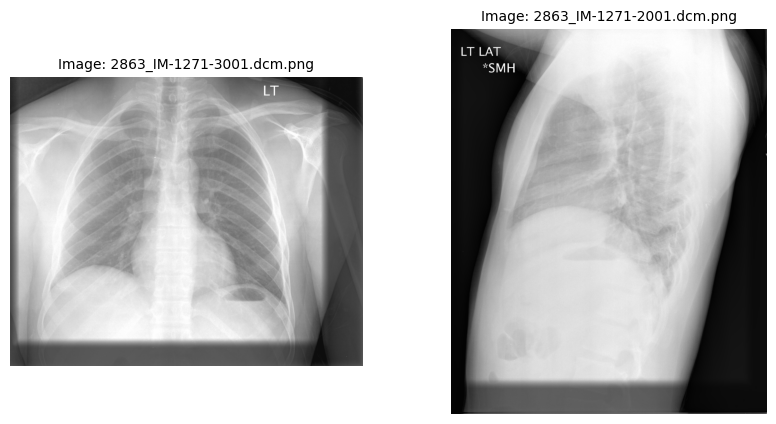


PATIENT UID: 472
FINDINGS:    Normal heart size and mediastinal contours. No focal airspace consolidation. No pleural effusion or pneumothorax. Stable postoperative and degenerative changes of the XXXX. Stable degenerative disc disease of the thoracic spine.
IMPRESSION:  No acute cardiopulmonary abnormalities.
IMAGES:      472_IM-2100-1001.dcm.png, 472_IM-2100-2001.dcm.png


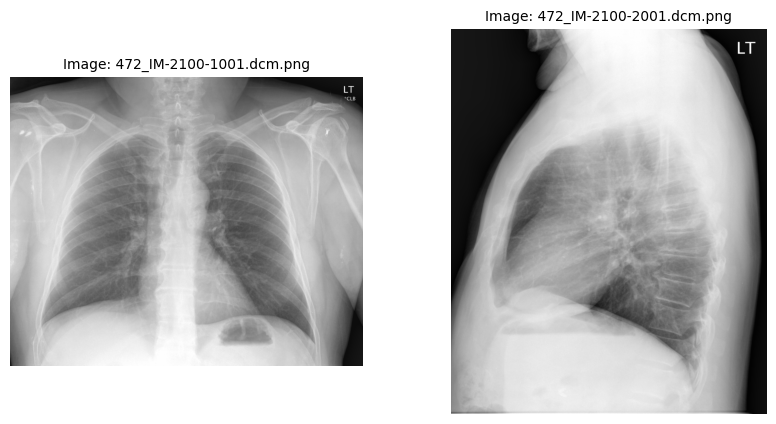


PATIENT UID: 302
FINDINGS:    Heart size within normal limits, stable mediastinal and hilar contours. No focal alveolar consolidation, no definite pleural effusion seen. No typical findings of pulmonary edema. Mild spine curvature again noted.
IMPRESSION:  No acute findings
IMAGES:      302_IM-1394-1001.dcm.png


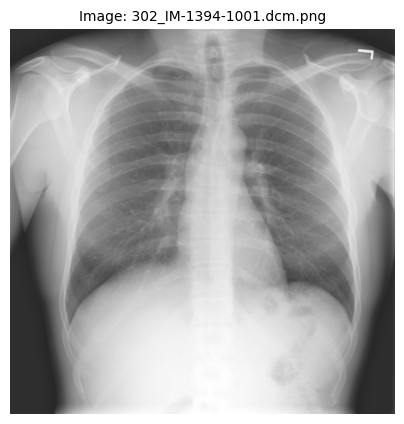


PATIENT UID: 3767
FINDINGS:    None
IMPRESSION:  Heart size, mediastinal silhouette, pulmonary vascularity are within normal limits. There is no lobar consolidation. No pleural effusion or pneumothorax.
IMAGES:      3767_IM-1886-2001.dcm.png, 3767_IM-1886-3001.dcm.png


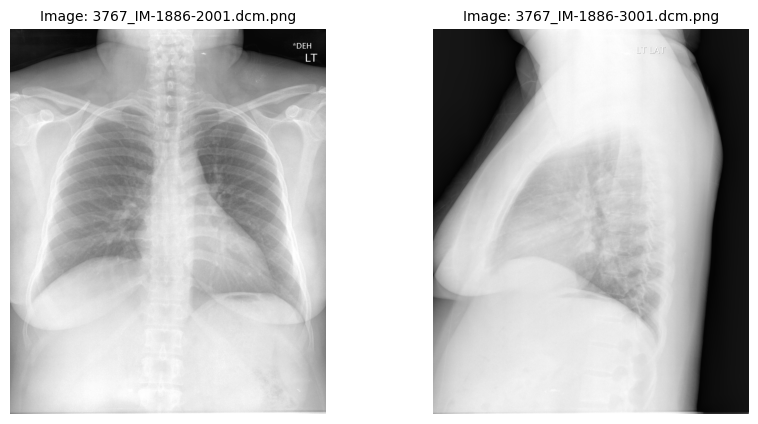


PATIENT UID: 3191
FINDINGS:    Borderline cardiac enlargement. Enlarged calcified thoracic aorta. Emphysema. No acute pulmonary abnormality. Mild spondylosis.
IMPRESSION:  Emphysema. No acute pulmonary findings.
IMAGES:      3191_IM-1505-1001.dcm.png, 3191_IM-1505-2001.dcm.png


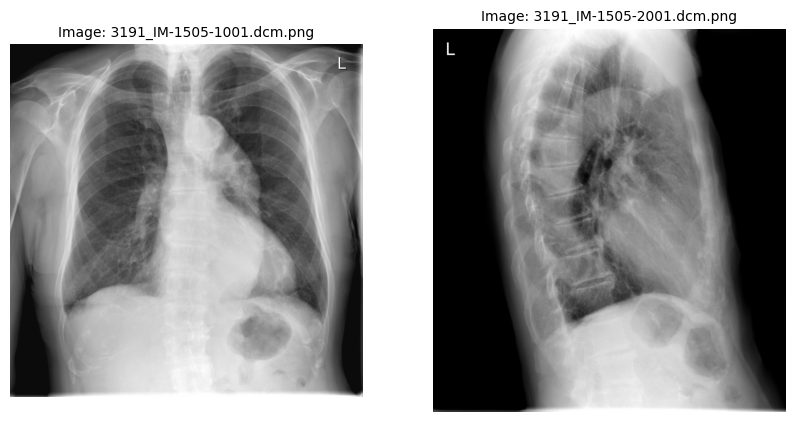


PATIENT UID: 3542
FINDINGS:    Heart size and mediastinal contours appear within normal limits. Pulmonary vascularity is within normal limits. No focal consolidation, suspicious pulmonary opacity, pneumothorax or definite pleural effusion. Visualized osseous structures appear intact.
IMPRESSION:  No acute cardiopulmonary abnormality. No radiographic evidence of metastatic disease in the chest.
IMAGES:      3542_IM-1734-1001.dcm.png, 3542_IM-1734-2001.dcm.png


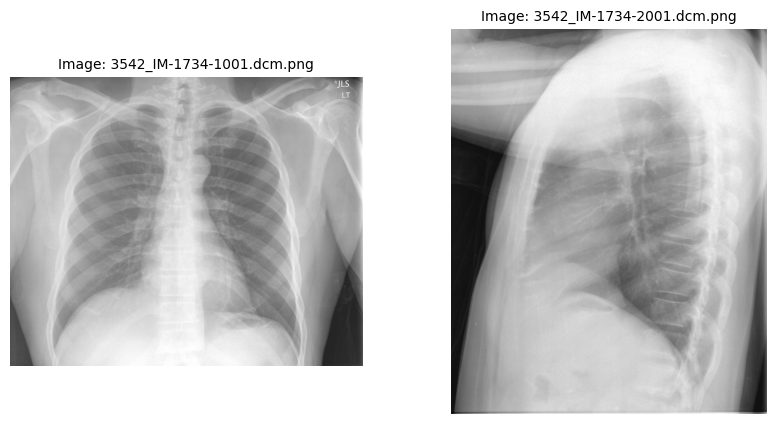


PATIENT UID: 2550
FINDINGS:    None
IMPRESSION:  Compared with prior examination mildly improved inspirational XXXX. Lung parenchyma is not clear. No acute airspace disease, large pleural effusions or pulmonary edema. No XXXX of acute cardiopulmonary disease.
IMAGES:      2550_IM-1058-1001.dcm.png


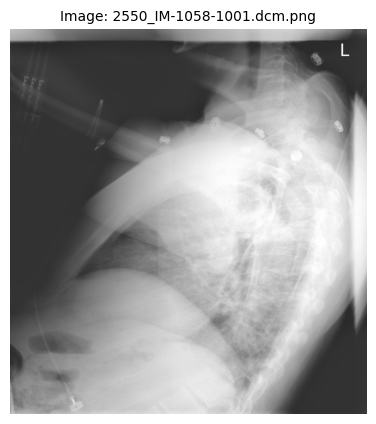


PATIENT UID: 2561
FINDINGS:    Lungs are clear bilaterally. Cardiac and mediastinal silhouettes are normal. Pulmonary vasculature is normal. No pneumothorax or pleural effusion. No acute bony abnormality.
IMPRESSION:  No acute cardiopulmonary abnormality.
IMAGES:      2561_IM-1064-1001.dcm.png


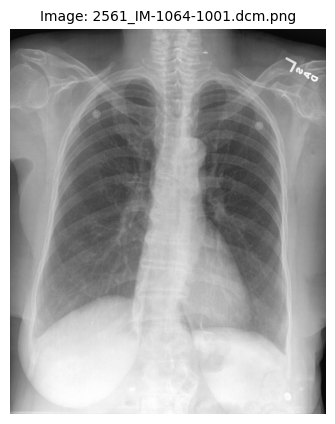


PATIENT UID: 623
FINDINGS:    The heart is normal in size. The mediastinum is stable. Atherosclerotic calcifications of the aorta. There is again a pleural based density in the right lung base, XXXX related to subpleural fat. The appearance is stable from multiple previous studies. The lungs are clear. There is no pleural effusion.
IMPRESSION:  No acute disease.
IMAGES:      623_IM-2205-2002.dcm.png, 623_IM-2205-3003.dcm.png


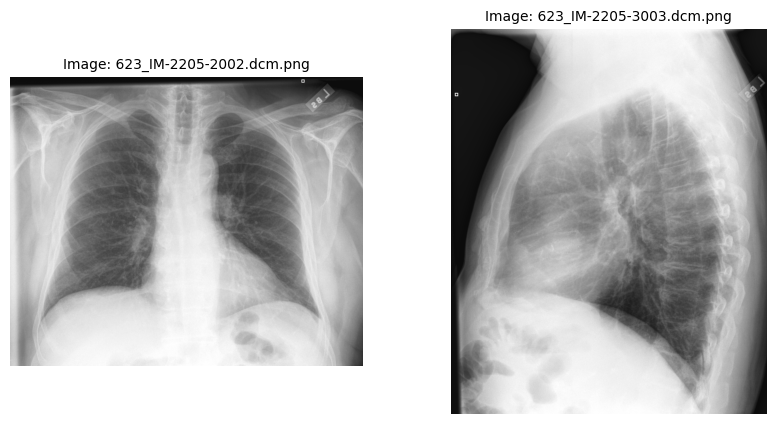


PATIENT UID: 970
FINDINGS:    Lungs are clear bilaterally with no focal infiltrate, pleural effusion, or pneumothoraces. Cardiomediastinal silhouette is within normal limits. XXXX and soft tissues are unremarkable.
IMPRESSION:  No acute cardiopulmonary abnormality. .
IMAGES:      970_IM-2460-2001.dcm.png, 970_IM-2460-3001.dcm.png


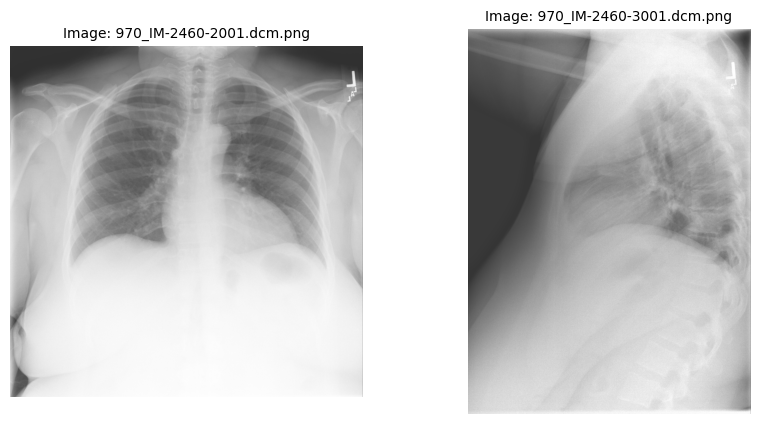


PATIENT UID: 3136
FINDINGS:    Cardiac size, mediastinal contour, and pulmonary vascularity are within normal limits. No focal consolidation, suspicious pulmonary opacity, pleural effusion, or pneumothorax. The visualized osseous structures appear intact.
IMPRESSION:  No acute cardiopulmonary abnormalities.
IMAGES:      3136_IM-1475-1001.dcm.png, 3136_IM-1475-2001.dcm.png


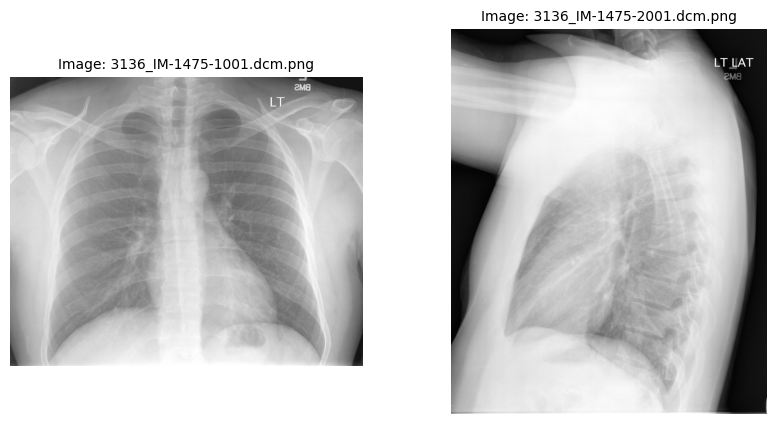


PATIENT UID: 2506
FINDINGS:    Cardiomegaly. There is no pulmonary edema. There is no focal consolidation. There are no XXXX of pleural effusion. There is no evidence of pneumothorax.
IMPRESSION:  Cardiomegaly similar to prior examination. Negative for evidence of acute pulmonary disease.
IMAGES:      2506_IM-1029-1001.dcm.png, 2506_IM-1029-2001.dcm.png


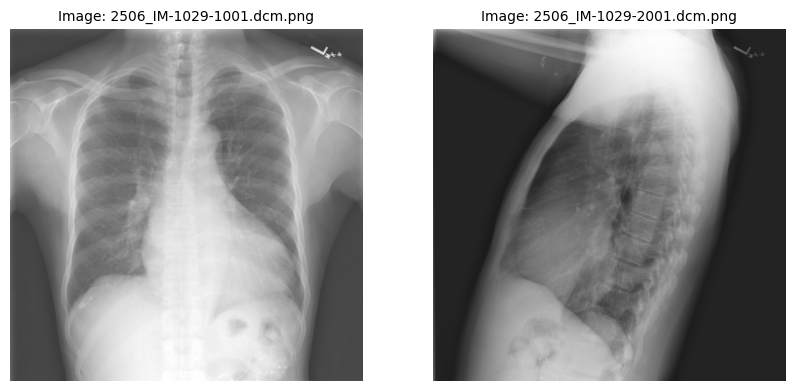


PATIENT UID: 424
FINDINGS:    The lungs are clear. There is no focal consolidation, pleural effusion, or pneumothorax. The Heart and mediastinum are normal size and shape. XXXX and soft tissues are unremarkable. Probable nerve stimulator noted.
IMPRESSION:  No Acute cardiopulmonary disease.
IMAGES:      424_IM-2067-2001.dcm.png


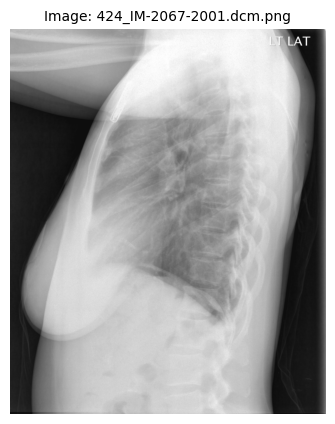


PATIENT UID: 2310
FINDINGS:    No focal consolidation. No visualized pneumothorax. The heart size is normal. There are no large pleural effusions.
IMPRESSION:  1. No acute cardiopulmonary findings.
IMAGES:      2310_IM-0885-1001.dcm.png, 2310_IM-0885-2001.dcm.png


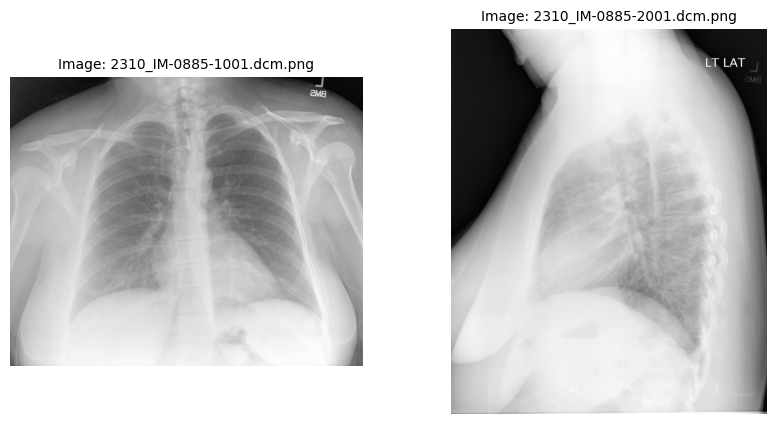


PATIENT UID: 422
FINDINGS:    None
IMPRESSION:  Calcified granuloma periphery left lung. Well-expanded and clear lungs. Mediastinal contour within normal limits. No acute cardiopulmonary abnormality identified.
IMAGES:      422_IM-2065-5001.dcm.png, 422_IM-2065-6001.dcm.png


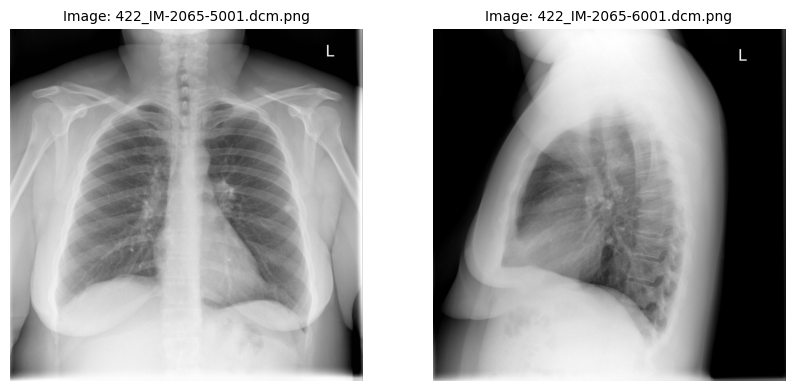


PATIENT UID: 3680
FINDINGS:    The heart is normal in size and contour. There is no mediastinal widening. Streaky bibasilar opacities, XXXX atelectasis. Vague opacity in the right midlung. Scattered calcified granulomas. No large pleural effusion or pneumothorax. The XXXX are intact.
IMPRESSION:  Vague opacity in the right midlung, this could reflect a small focus of atelectasis or infiltrate. Bibasilar airspace opacities, XXXX atelectasis.
IMAGES:      3680_IM-1832-1001.dcm.png, 3680_IM-1832-2001.dcm.png


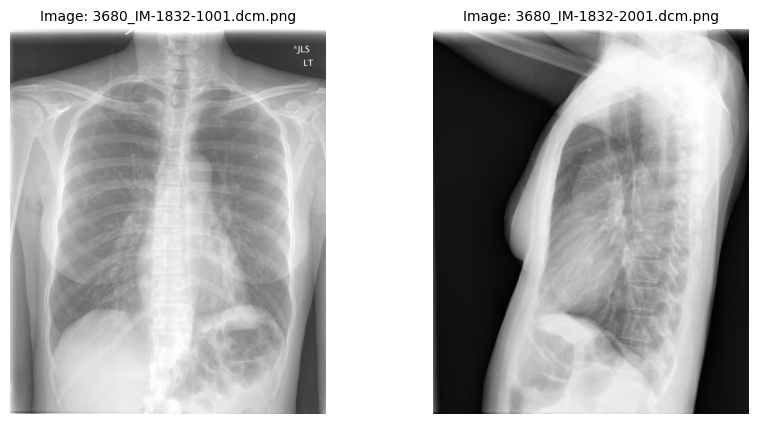


PATIENT UID: 2328
FINDINGS:    Heart size is normal. The lungs are clear. There are no XXXX focal air space consolidations. No pleural effusions or pneumothoraces. The hilar and mediastinal contours are unchanged. Again noted is tortuosity and unfolding of the thoracic aorta. Aortic vascular calcifications. Normal pulmonary vascularity. Bone demineralization.
IMPRESSION:  No acute abnormality.
IMAGES:      2328_IM-0898-1001.dcm.png, 2328_IM-0898-2001.dcm.png


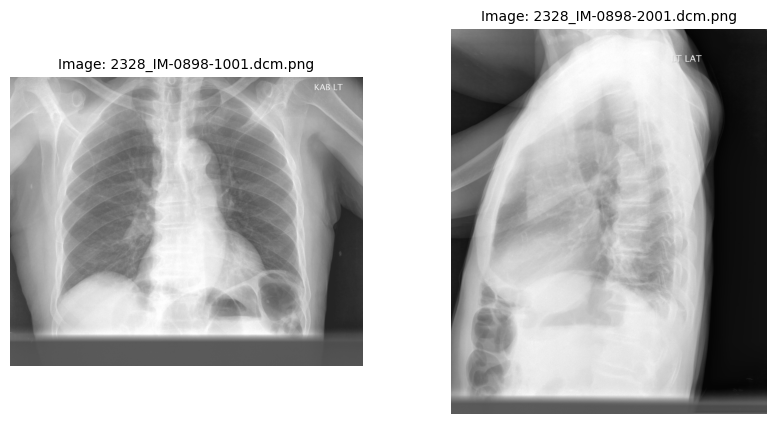


PATIENT UID: 1666
FINDINGS:    The cardiac silhouette is mildly enlarged. There are scattered bilateral XXXX opacities, most notably in the right middle lobe, XXXX XXXX of subsegmental atelectasis. No pleural effusion. No pneumothorax is identified. There are diffuse degenerative changes of the spine.
IMPRESSION:  1. Scattered XXXX of subsegmental atelectasis, most notably in the right middle lobe. 2. Mildly enlarged cardiac silhouette; cardiomegaly versus pericardial effusion.
IMAGES:      1666_IM-0440-0001-0001.dcm.png, 1666_IM-0440-0001-0002.dcm.png


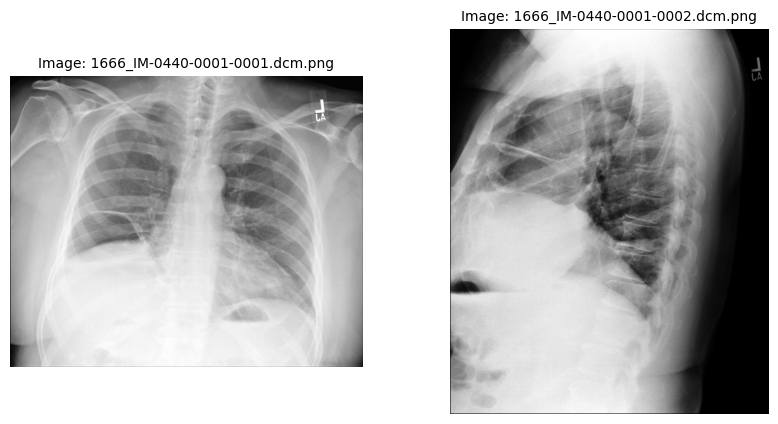


PATIENT UID: 2873
FINDINGS:    Heart size and vascularity normal. External contour normal. Lungs clear. No pleural effusions or pneumothoraces.
IMPRESSION:  No acute cardiopulmonary process.
IMAGES:      2873_IM-1279-2002.dcm.png, 2873_IM-1279-3003.dcm.png


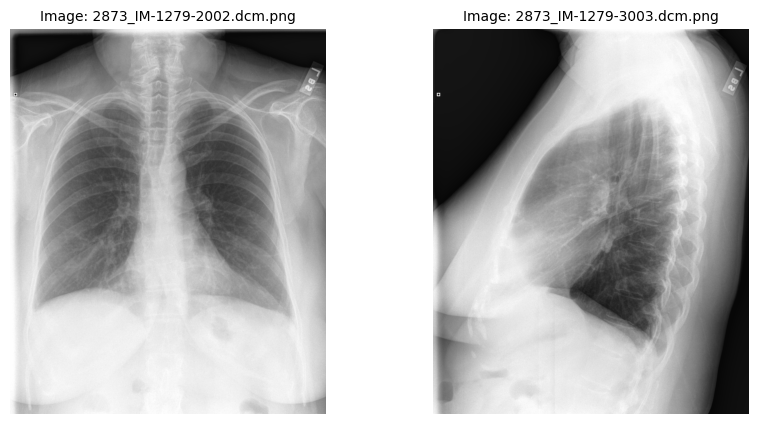


PATIENT UID: 2970
FINDINGS:    Heart size and mediastinal contours are stable. Stable calcification of the thoracic aorta. Pulmonary vasculature is within normal limits. There is no focal air space opacity. No pleural effusion or pneumothorax is seen. No acute bony abnormality is demonstrated.
IMPRESSION:  No acute cardiopulmonary abnormality.
IMAGES:      2970_IM-1362-1001.dcm.png, 2970_IM-1362-2001.dcm.png


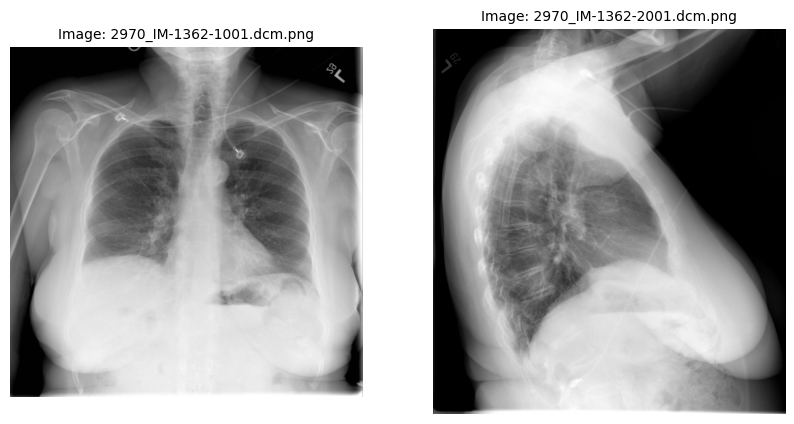

In [10]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os

# 1. Group by UID to get unique reports and their list of images
# We aggregate 'filename' into a list and take the 'first' instance of text columns
grouped = merged_df.groupby('uid').agg({
    'findings': 'first',
    'impression': 'first',
    'filename': list
}).reset_index()

# 2. Select 20 random unique reports
# If your dataset has fewer than 20 unique reports, it will take all of them
sample_size = min(20, len(grouped))
random_samples = grouped.sample(n=sample_size, random_state=42)

# 3. Path to images
img_folder = "/kaggle/input/chest-xrays-indiana-university/images/images_normalized/"

# 4. Loop through the 20 samples and display
for idx, row in random_samples.iterrows():
    print(f"\n{'='*100}")
    print(f"PATIENT UID: {row['uid']}")
    print(f"FINDINGS:    {row['findings']}")
    print(f"IMPRESSION:  {row['impression']}")
    print(f"IMAGES:      {', '.join(row['filename'])}")
    print(f"{'='*100}")
    
    # Setup plotting for the images associated with this specific UID
    filenames = row['filename']
    num_imgs = len(filenames)
    
    plt.figure(figsize=(5 * num_imgs, 5))
    
    for i, fname in enumerate(filenames):
        path = os.path.join(img_folder, fname)
        img = cv2.imread(path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(1, num_imgs, i + 1)
            plt.imshow(img)
            plt.title(f"Image: {fname}", fontsize=10)
            plt.axis('off')
        else:
            print(f"Warning: Could not load image {fname}")
            
    plt.show()


/tmp/ipykernel_92/2380335310.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_reports['findings_word_count'] = unique_reports['findings'].fillna('').apply(lambda x: len(str(x).split()))
/tmp/ipykernel_92/2380335310.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_reports['impression_word_count'] = unique_reports['impression'].fillna('').apply(lambda x: len(str(x).split()))


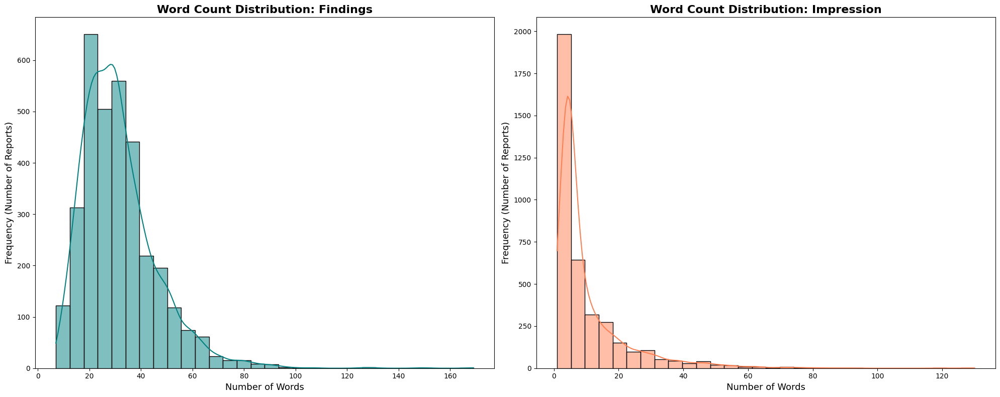

--- Text Complexity Statistics ---
Average Words in Findings:   31.45
Max Words in Findings:       169
-----------------------------------
Average Words in Impression: 10.56
Max Words in Impression:     130


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Get unique reports to avoid overcounting patients with multiple images
unique_reports = merged_df.drop_duplicates(subset=['uid'])

# 2. Calculate word counts for Findings and Impressions
# We fill NaN with empty strings to allow the split() function to work, then calculate length
unique_reports['findings_word_count'] = unique_reports['findings'].fillna('').apply(lambda x: len(str(x).split()))
unique_reports['impression_word_count'] = unique_reports['impression'].fillna('').apply(lambda x: len(str(x).split()))

# 3. Visualization
plt.figure(figsize=(20, 8))

# Plot for Findings
plt.subplot(1, 2, 1)
sns.histplot(unique_reports[unique_reports['findings_word_count'] > 0]['findings_word_count'], 
             bins=30, kde=True, color='teal', edgecolor='black')
plt.title('Word Count Distribution: Findings', fontsize=16, fontweight='bold')
plt.xlabel('Number of Words', fontsize=13)
plt.ylabel('Frequency (Number of Reports)', fontsize=13)

# Plot for Impressions
plt.subplot(1, 2, 2)
sns.histplot(unique_reports[unique_reports['impression_word_count'] > 0]['impression_word_count'], 
             bins=30, kde=True, color='coral', edgecolor='black')
plt.title('Word Count Distribution: Impression', fontsize=16, fontweight='bold')
plt.xlabel('Number of Words', fontsize=13)
plt.ylabel('Frequency (Number of Reports)', fontsize=13)

plt.tight_layout()
plt.show()

# 4. Display Statistical Summary
print("--- Text Complexity Statistics ---")
print(f"Average Words in Findings:   {unique_reports[unique_reports['findings_word_count'] > 0]['findings_word_count'].mean():.2f}")
print(f"Max Words in Findings:       {unique_reports['findings_word_count'].max()}")
print("-" * 35)
print(f"Average Words in Impression: {unique_reports[unique_reports['impression_word_count'] > 0]['impression_word_count'].mean():.2f}")
print(f"Max Words in Impression:     {unique_reports['impression_word_count'].max()}")

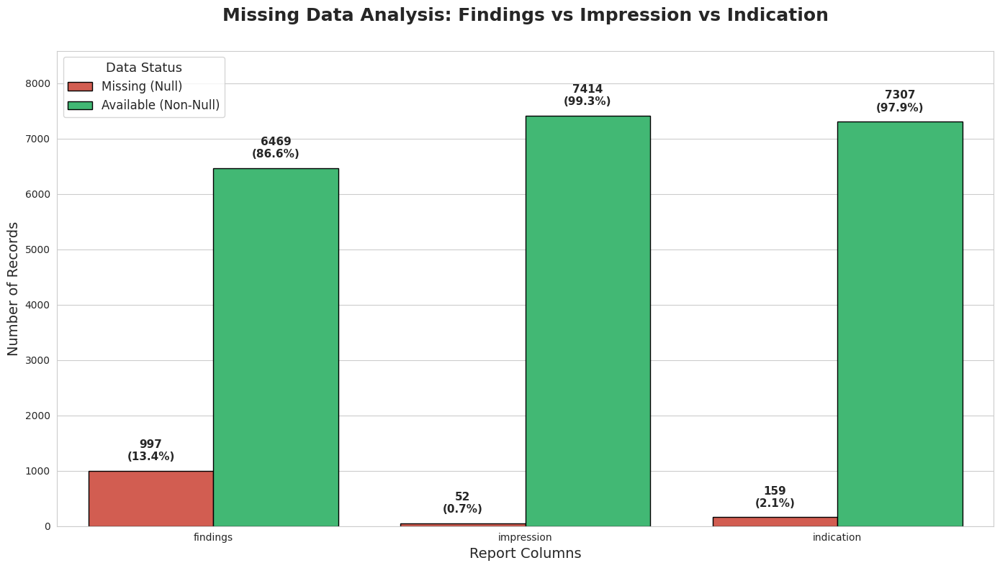


MISSING DATA SUMMARY (SPARSITY CHECK)
                          Count                          Percentage  \
Status     Available (Non-Null) Missing (Null) Available (Non-Null)   
Column                                                                
findings                 6469.0          997.0            86.646129   
impression               7414.0           52.0            99.303509   
indication               7307.0          159.0            97.870346   

                           
Status     Missing (Null)  
Column                     
findings        13.353871  
impression       0.696491  
indication       2.129654  
Total rows in Merged Dataset: 7466


In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Identify the columns to analyze
cols_to_check = ['findings', 'impression', 'indication']

# 2. Calculate Null vs Non-Null counts
# We create a dictionary to store the counts for each column
missing_data = []
for col in cols_to_check:
    null_count = merged_df[col].isna().sum()
    non_null_count = merged_df[col].notna().sum()
    total = len(merged_df)
    missing_data.append({
        'Column': col,
        'Status': 'Missing (Null)',
        'Count': null_count,
        'Percentage': (null_count / total) * 100
    })
    missing_data.append({
        'Column': col,
        'Status': 'Available (Non-Null)',
        'Count': non_null_count,
        'Percentage': (non_null_count / total) * 100
    })

missing_df = pd.DataFrame(missing_data)

# 3. Create the Visualization
plt.figure(figsize=(14, 8))
sns.set_style("whitegrid")

# Create a grouped bar chart
ax = sns.barplot(data=missing_df, x='Column', y='Count', hue='Status', palette=['#e74c3c', '#2ecc71'], edgecolor='black')

# 4. Add labels and percentages on top of the bars
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        # Calculate percentage for the label
        total_rows = len(merged_df)
        percentage = (height / total_rows) * 100
        ax.annotate(f'{int(height)}\n({percentage:.1f}%)', 
                    (p.get_x() + p.get_width() / 2., height), 
                    ha='center', va='center', 
                    xytext=(0, 20), 
                    textcoords='offset points',
                    fontsize=11, fontweight='bold')

plt.title('Missing Data Analysis: Findings vs Impression vs Indication', fontsize=18, fontweight='bold', pad=30)
plt.ylabel('Number of Records', fontsize=14)
plt.xlabel('Report Columns', fontsize=14)
plt.ylim(0, len(merged_df) * 1.15) # Add space for labels
plt.legend(title='Data Status', fontsize=12, title_fontsize='13')

plt.tight_layout()
plt.show()

# 5. Display Summary Table
print("\n" + "="*60)
print("MISSING DATA SUMMARY (SPARSITY CHECK)")
print("="*60)
summary = missing_df.pivot(index='Column', columns='Status', values=['Count', 'Percentage'])
print(summary)
print("="*60)
print(f"Total rows in Merged Dataset: {len(merged_df)}")

In [13]:
import pandas as pd

# 1. Identify UIDs that have exactly 2 images
uid_counts = merged_df['uid'].value_counts()
uids_with_2 = uid_counts[uid_counts == 2].index

# 2. Create a temporary dataframe with these candidates
temp_df = merged_df[merged_df['uid'].isin(uids_with_2)].copy()

# 3. Define a function to verify the "Frontal + Lateral" requirement
def has_required_views(group):
    # Standardize projections to lowercase for comparison
    projs = group['projection'].str.lower().tolist()
    
    # Check for Frontal indicators (PA, AP, or Frontal)
    frontal_check = any(p in ['pa', 'ap', 'frontal'] or 'front' in p for p in projs)
    # Check for Lateral indicators
    lateral_check = any('lateral' in p for p in projs)
    
    return frontal_check and lateral_check

# 4. Filter the dataframe to keep only those that pass the check
# We group by uid and apply the function, keeping only the UIDs that return True
valid_uids = temp_df.groupby('uid').filter(has_required_views)['uid'].unique()

# 5. Save the final result into final_df
final_df = merged_df[merged_df['uid'].isin(valid_uids)].copy().reset_index(drop=True)

# 6. Verify the results
print("="*50)
print("FINAL FILTERED DATASET SUMMARY")
print("="*50)
print(f"Total Unique Reports (UIDs): {final_df['uid'].nunique()}")
print(f"Total Images in final_df:    {len(final_df)}")
print(f"Columns Retained: {list(final_df.columns)}")
print("="*50)

# Display a sample of one complete patient record (2 rows)
display(final_df.head(2))

FINAL FILTERED DATASET SUMMARY
Total Unique Reports (UIDs): 3194
Total Images in final_df:    6388
Columns Retained: ['uid', 'MeSH', 'Problems', 'image', 'indication', 'comparison', 'findings', 'impression', 'filename', 'projection']


,uid,MeSH,Problems,image,indication,comparison,findings,impression,filename,projection
0,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-4001.dcm.png,Frontal
1,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-3001.dcm.png,Lateral


In [14]:
display(final_df.head(100))

,uid,MeSH,Problems,image,indication,comparison,findings,impression,filename,projection
0,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-4001.dcm.png,Frontal
1,1,normal,normal,Xray Chest PA and Lateral,Positive TB test,None.,The cardiac silhouette and mediastinum size ar...,Normal chest x-XXXX.,1_IM-0001-3001.dcm.png,Lateral
2,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-1001.dcm.png,Frontal
3,2,Cardiomegaly/borderline;Pulmonary Artery/enlarged,Cardiomegaly;Pulmonary Artery,"Chest, 2 views, frontal and lateral",Preop bariatric surgery.,None.,Borderline cardiomegaly. Midline sternotomy XX...,No acute pulmonary findings.,2_IM-0652-2001.dcm.png,Lateral
4,3,normal,normal,Xray Chest PA and Lateral,"rib pain after a XXXX, XXXX XXXX steps this XX...",NaN,NaN,"No displaced rib fractures, pneumothorax, or p...",3_IM-1384-1001.dcm.png,Frontal
...,...,...,...,...,...,...,...,...,...,...
95,51,Calcified Granuloma/lung/bilateral/scattered,Calcified Granuloma,"CHEST 2V FRONTAL/LATERAL XXXX, XXXX XXXX XXXX",preop XXXX,"Chest 2 views from XXXX, XXXX. .",Heart size is normal and cardiomediastinal sil...,No acute cardiopulmonary abnormality.,51_IM-2125-1002.dcm.png,Lateral
96,52,normal,normal,"PA and Lateral Chest Radiograph XXXX, XXXX at ...",XXXX-year-old male with chest pain,NaN,The heart is normal size. The mediastinum is u...,No acute cardiopulmonary abnormality.,52_IM-2131-1001.dcm.png,Frontal
97,52,normal,normal,"PA and Lateral Chest Radiograph XXXX, XXXX at ...",XXXX-year-old male with chest pain,NaN,The heart is normal size. The mediastinum is u...,No acute cardiopulmonary abnormality.,52_IM-2131-2001.dcm.png,Lateral
98,53,Lung/hypoinflation/severe;Opacity/lung/base/ri...,Lung;Opacity;Pulmonary Atelectasis,"CHEST (PA AND LATERAL) on XXXX, XXXX.","Dizziness, hypoxia.","PA and lateral views of the chest on XXXX, XXXX.",There extremely low lung volumes. there is rig...,Low lung volumes with right basilar atelectasi...,53_IM-2138-1001.dcm.png,Frontal


--- Complete Data for Patient UID: 1470 ---


,uid,MeSH,Problems,image,indication,comparison,findings,impression,filename,projection
2320,1470,normal,normal,PA and lateral views of the chest,Chest pain,NaN,Mediastinal contours are normal. Lungs are cle...,No acute cardiopulmonary abnormality.,1470_IM-0303-1001.dcm.png,Frontal
2321,1470,normal,normal,PA and lateral views of the chest,Chest pain,NaN,Mediastinal contours are normal. Lungs are cle...,No acute cardiopulmonary abnormality.,1470_IM-0303-2001.dcm.png,Lateral


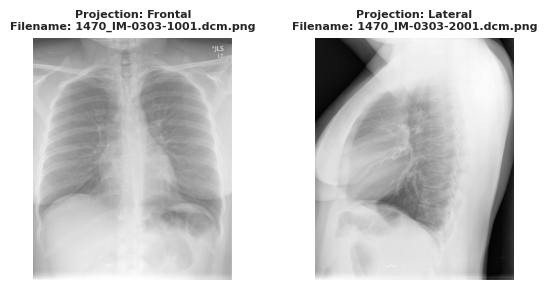

In [20]:
import random
import cv2
import matplotlib.pyplot as plt
import os

# 1. Select a random UID from the filtered final_df
random_uid = random.choice(final_df['uid'].unique())

# 2. Extract all rows associated with this UID
# This will show all columns including findings, impressions, MeSH, etc.
sample_record = final_df[final_df['uid'] == random_uid]

print(f"--- Complete Data for Patient UID: {random_uid} ---")
# This displays the 10+ columns in a table format
display(sample_record)

# 3. Plotting the Frontal and Lateral Images
img_folder = "/kaggle/input/chest-xrays-indiana-university/images/images_normalized/"
filenames = sample_record['filename'].tolist()
projections = sample_record['projection'].tolist()

plt.figure(figsize=(6, 3))

for i, (fname, proj) in enumerate(zip(filenames, projections)):
    img_path = os.path.join(img_folder, fname)
    img = cv2.imread(img_path)
    
    if img is not None:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 2, i + 1)
        plt.imshow(img)
        plt.title(f"Projection: {proj}\nFilename: {fname}", fontsize=8, fontweight='bold')
        plt.axis('off')
    else:
        print(f"Warning: Image {fname} not found.")

plt.tight_layout()
plt.show()

Displaying small preview for UID: 1200


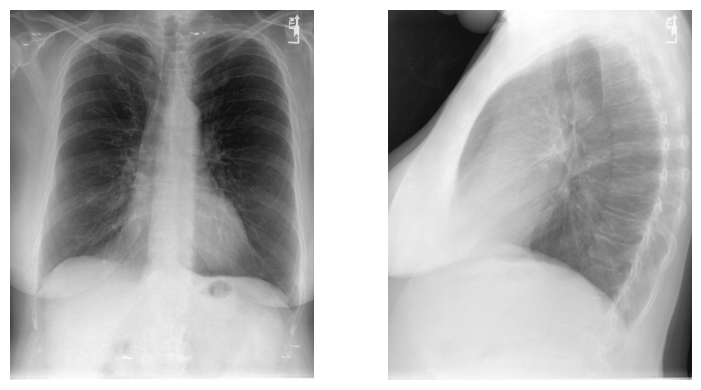

,uid,MeSH,Problems,image,indication,comparison,findings,impression,filename,projection
1902,1200,Opacity/lung/hilum/right/small,Opacity,XR PA and lateral chest.,"XXXX, smoking.",NaN,The heart is not enlarged. The central pulmona...,Small right juxtahilar opacity may represent i...,1200_IM-0134-1001.dcm.png,Frontal
1903,1200,Opacity/lung/hilum/right/small,Opacity,XR PA and lateral chest.,"XXXX, smoking.",NaN,The heart is not enlarged. The central pulmona...,Small right juxtahilar opacity may represent i...,1200_IM-0134-2001.dcm.png,Lateral


In [17]:
import random
import cv2
import matplotlib.pyplot as plt
import os

# 1. Select a random UID
random_uid = random.choice(final_df['uid'].unique())
sample_record = final_df[final_df['uid'] == random_uid]

print(f"Displaying small preview for UID: {random_uid}")

# 2. Adjust figsize to make images smaller (e.g., 8 inches wide, 4 inches tall)
plt.figure(figsize=(8, 4)) 

img_folder = "/kaggle/input/chest-xrays-indiana-university/images/images_normalized/"
filenames = sample_record['filename'].tolist()

for i, fname in enumerate(filenames):
    img_path = os.path.join(img_folder, fname)
    img = cv2.imread(img_path)
    
    if img is not None:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, 2, i + 1)
        plt.imshow(img)
        plt.axis('off') # Hiding axis also makes it look cleaner when small

plt.tight_layout()
plt.show()

# Display the table data below the images
display(sample_record)